# Notebook for quality control of MEG data

Authors: Lucas Breedt & Mona Zimmerman

This notebook is meant to help in checking MEG data.  
Note that pre-processing of the data is not included in this notebook -- it assumes data have already been processed

## Table of contents
1. [Imports](#imports)
2. [Load data](#load-data)
3. [Checking the data - I](#data-check-1)  
    a. [Visual inspection of the epochs](#visual-inspection)  
    b. [The power spectrum](#power-spectrum)  
4. [Fast Fourier transform & defining functional connectivity](#fft-fc)  
    a. [The Phase Lag Index (PLI)](#pli)  
    b. [The Amplitude Envelope Correlation (AEC)](#aec)
5. [Checking the data - II](#data-check-2)  
    a. [Adjacency matrices](#adjacency-matrix)  
    b. [Check for weird/empty signals](#check-signal)  
    c. [The occipital network](#occ-network)  

In [ ]:
### TO DO:
# --- calculate PLI for multiple/all epochs (of multiple subs)
# --- compare plot & AEC to BrainWave
# --- check/improve structure of notebook
# --- check imports (which are and which aren't necessary?)
# --- improve/clean up/add text & explanation
# --- set up similarly to Eduarda & Fernando's TDA notebook - functions separately?

<a id='imports'></a>
## **1.** Imports
#### Let's first import all the necessary packages...

In [144]:
# Basic libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.graph_objects import Layout, YAxis, Scatter, Annotation, Annotations, Data, Figure, Marker, Font
from tqdm import tqdm
import matplotlib as mpl
import scipy
import statsmodels.api as sm
import math
import os

# Signal processing libraries
from scipy import signal
from scipy.signal import hilbert
from scipy.fft import fft, irfft2, ifft2, irfftn, irfft, ifft
from scipy.fftpack import hilbert

# Set seaborn style for plot syling
sns.set()

In [111]:

import statsmodels.api as sm
import math



<a id='load-data'></a>
## **2.** Load data
#### ...and load the MEG data.

In [3]:
# Loading a single ascii of one subject
file = pd.read_csv('/home/kingwizard/mumo_projects/meg_datacheck/meg_data/sub_01/OD1_Tr01.asc', 
                   delimiter='\t', header=None, index_col=False)

In [ ]:
# Load all asciis
### --- I guess for one sub for now - would be nice to write some sort of loop/function to do it for all
### --- subs in a folder 

##### The shape of the file should be the number of samples in your epoch x the number of regions; so let's do a quick check just to make sure:

In [3]:
file.shape

(16384, 246)

In [5]:
# Convert the data from a dataframe to a numpy array for future operations
file_np = file.to_numpy()

<a id='data-check-1'></a>
## **3.** Checking the data - I
<a id='visual-inspection'></a>
### a. Visual inspection of the epochs
As a quick visual check of your data, we'll now plot the first 3 seconds of data of every 10th region of one epoch; this should give you a global overview of the data.

In [4]:
### --- should regions be a list? so people can decide which regions they want to include? and then maybe
### --- we can add a parameter to choose between every nth channel or exact specified channels
def plot_timeseries(file_np, fs=1250, seconds_to_plot=3, start=0, regions=210, step=10):
    """ Plot several seconds of data from multiple channels of timeseries data
    
    Parameters
    ----------
    file_np: ndarray
        Rows are timepoints, columns are rois/electrodes
    fs: int, optional
        Sample frequency, default=1250
    seconds_to_plot: int, optional
        Amount of seconds of data to be plotted, default=3 seconds
    start: int, optional
        Starting point of plot, default=0 (ie beginning of timeseries)
    regions: int, ndarray, optional
        Number or range of regions you wish to use
    step: int, optional
        Plot every nth channel, default=10 (ie plot every 10th channel)
        
    Returns
    -------
    plot?
        
    Notes
    -----
    Code used in this function was adapted from https://plotly.com/python/v3/ipython-notebooks/mne-tutorial/

    """

    ns = file.shape[0] # total number of samples per epoch
    time = np.linspace(0, ns/fs, ns) # time in seconds per sample
    time_stp = time[fs*start:(fs*start + (fs*seconds_to_plot -1))] # this will be the x-axis of the plot, indicating the time in seconds
    file_stp = file_np[fs*start:(fs*start + (fs*seconds_to_plot -1))] # this is a subset of the epoch, containing stp seconds of data
    
    if type(regions) != int:
        channels = np.arange(regions[0], regions[-1]+1, step=step)
    else:
        channels = np.arange(step-1, regions, step=step)
        
    n_channels = len(channels)
    
    step = 1. / n_channels
    kwargs = dict(domain=[1 - step, 1], showticklabels=False, zeroline=False, showgrid=False)
    
    # create objects for layout and traces
    layout = Layout(yaxis=YAxis(kwargs), showlegend=False)
    traces = [Scatter(x=time_stp, y=file_stp[:, 0])]
    
    # loop over the channels
    for ii in range(1, n_channels):
            kwargs.update(domain=[1 - (ii + 1) * step, 1 - ii * step])
            layout.update({'yaxis%d' % (ii + 1): YAxis(kwargs), 'showlegend': False})
            traces.append(Scatter(x=time_stp, y=file_stp[:, channels[ii]], yaxis='y%d' % (ii + 1)))
    
    # add channel names using Annotations
    annotations = Annotations([go.layout.Annotation(x=-0.06, y=0, xref='paper', yref='y%d' % (ii + 1), 
                                                    text='ROI ' + str(channels[ii] + 1), showarrow=False)
                              for ii in range(0, n_channels)])
    layout.update(annotations=annotations)
    
    # set the size of the figure and plot it
    layout.update(autosize=False, width=1000, height=800, 
                  title={'text':'<b>Time: '+str(start)+'s - '+str(start+seconds_to_plot)+'s</b>',
                         'y':0.9,
                         'x':0.5,
                        'yanchor':'top',
                        'xanchor':'center'},
                  xaxis=dict(showticklabels=False, tickmode='array', tickvals=np.arange(start+1, 
                                                                                        start+seconds_to_plot+1, 1)))
    #x_values = list(range(1,11))
    #xaxes_dict = [dict(x=x_val, y=-0.5, xref='x', yref='y10', text=str(x_val), 
    #                   showarrow=False) for x_val in x_values]
    #xaxis_title = [dict(x=2.6, y=-0.5, xref='x', yref='y10', text="Time (s)", showarrow=False)]
    #axes_dict = xaxes_dict + xaxis_title + yaxes_dict 
    #layout.update(annotations=axes_dict)
    fig = Figure(data=Data(traces), layout=layout)
    
    return go.Figure(fig)

##### You'll have to set some variables first; change these to fit your needs.

In [6]:
fs = 1250 # sample size; so this is the amount of samples per second
seconds_to_plot = 3 # indicate how many seconds of data you want to plot
start = 0 # start-time of plot in seconds; indicate where you want plot to start (default = 0 for first stp s)
regions = 210 # number or range of regions you wish to use
step = 10 # set step size, every nth channel is plotted; default is 10, e.g. 1 would be every channel

##### And, finally, here is the plot, displaying a couple seconds of the timeseries of every 10th region of the epoch:

In [7]:
plot_timeseries(file_np, seconds_to_plot=seconds_to_plot, start=start, fs=fs, regions=regions, step=step)

/home/kingwizard/anaconda3/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:578: DeprecationWarning: plotly.graph_objs.YAxis is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.YAxis
  - plotly.graph_objs.layout.scene.YAxis

  DeprecationWarning,
/home/kingwizard/anaconda3/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:68: DeprecationWarning: plotly.graph_objs.Annotations is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.layout.Annotation
  - plotly.graph_objs.layout.scene.Annotation

  DeprecationWarning,
/home/kingwizard/anaconda3/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:40: DeprecationWarning: plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogra

##### Nice! Now let's also plot a couple seconds of the timeseries in the occipital regions only - since that is where we would expect to see an alpha rhythm more clearly.

In [8]:
fs = 1250 # sample size; so this is the amount of samples per second
seconds_to_plot = 3 # indicate how many seconds of data you want to plot
start = 0 # start-time of plot in seconds; indicate where you want plot to start (default = 0 for first stp s)
regions = np.arange(188, 210) # number or range of regions you wish to use
step = 1 # set step size, every nth channel is plotted; default is 10, e.g. 1 would be every channel

In [9]:
plot_timeseries(file_np, seconds_to_plot=seconds_to_plot, start=start, fs=fs, regions=regions, step=step)

/home/kingwizard/anaconda3/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:578: DeprecationWarning:

plotly.graph_objs.YAxis is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.YAxis
  - plotly.graph_objs.layout.scene.YAxis


/home/kingwizard/anaconda3/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:68: DeprecationWarning:

plotly.graph_objs.Annotations is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.layout.Annotation
  - plotly.graph_objs.layout.scene.Annotation


/home/kingwizard/anaconda3/lib/python3.7/site-packages/plotly/graph_objs/_deprecations.py:40: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.




<a id='power-spectrum'></a>
### **b.** The power spectrum
Now we'll calculate and plot the power spectrum. Also, to ensure a dominant alpha rhythm is present occipitally, we will look at occipital versus non-occipital power spectra.

In [10]:
# First we define a function to calculate and plot the power spectrum -- this is taken from Tianne's scripts
# and slightly modified
### --- don't know if this is the best way to do it, maybe import from somewhere else?
### !NOTE! added option to save powerspectrum; if set to True it returns f and pxx, otherwise it doesn't
def cal_power_spectrum (timeseries, nr_rois=np.arange(210), fs=1250, 
            window='hamming', nperseg=4096, scaling='spectrum', 
            plot_figure=False, title_plot='average power spectrum', save_powspec=True):

    """ Calculate (and plot) power spectrum of timeseries
    
    Parameters
    ----------
    timeseries: DataFrame with ndarrays
        Rows are timepoints, columns are rois/electrodes
    nr_rois: int, optional
        Give list with rois/electrodes you want to include, 
        default=np.arange(210)
    fs: int, optional    
        Sample frequency, default=1250    
    window: str or tuple, optional
        Type of window you want to use, check spectral.py for details, 
        default='hamming'
    nperseg : int, optional    
        Length of each segment, default=4096
    scaling : str, optional
        'density' calculates the power spectral density (V**2/Hz), 'spectrum' 
        calculates the power spectrum (V**2), default='spectrum'
    plot_figure: bool, optional
        Creates a figure of the mean + std over all rois/electrodes, 
        default=False
    title_plot: str, optional
        Give title of the plot, default='average power spectrum'
    save_powspec: bool, optional
        If False, f and pxx are not returned (if only plot is required),
        default=True
        
    Returns
    -------
    f: ndarray
        Array with sample frequencies (x-asix of power spectrum plot)
    pxx: ndarray
        Columns of power spectra for each roi/VE
            
    """
  
    pxx = np.empty([int(nperseg/2+1), np.size(nr_rois)])
    
    i=0
    for roi in nr_rois:
        (f, pxx[:,i]) = signal.welch(timeseries[roi].values, fs, window, 
                                     nperseg, scaling=scaling)
        i=i+1
    if plot_figure==True:
        plt.figure(figsize=(20, 10))
        plt.plot(f, np.mean(pxx,1), color='teal', linewidth=3)
        #plt.plot(f, np.mean(pxx,1)+np.std(pxx,1), color='teal', linewidth=0.7)
        #plt.plot(f, np.mean(pxx,1)-np.std(pxx,1), color='teal', linewidth=0.7)
        #plt.fill_between(f, np.mean(pxx,1)+np.std(pxx,1), np.mean(pxx,1)
        #                 -np.std(pxx,1), color='teal', alpha=0.2)
        plt.xlim(0, 50)
        plt.xlabel('Frequency (Hz)')
        plt.title(title_plot, size=15, weight='bold')
        plt.show()
        
    if save_powspec==True:
        return f, pxx

##### We'll first look at the full powerspectrum...

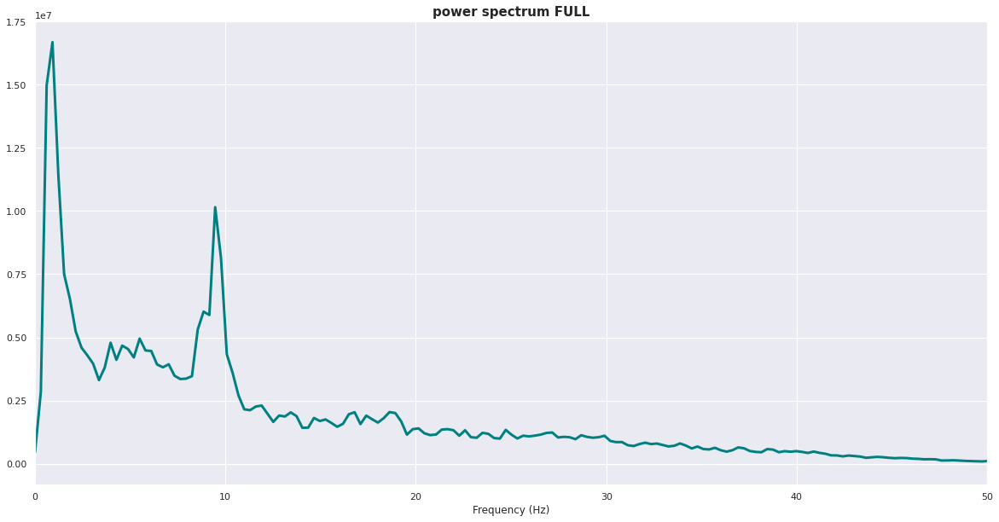

In [11]:
# Calculate and plot, for a single epoch of one subject, the full powerspectrum...
cal_power_spectrum(file, fs=fs, plot_figure=True, title_plot='power spectrum FULL', save_powspec=False)

##### ...but it's much more interesting to look at the powerspectrum of occipital vs non-occipital regions. 
alpha, yada yada

Specify which regions are occipital and which are non-occipital, and then we'll calculate powerspectrum for both.

In [12]:
occ_rois = np.arange(188,210) # Change this variable according to the atlas you used
nonocc_rois = np.arange(188) # Change this variable according to the atlas you used

f_occ, pxx_occ = cal_power_spectrum(file, fs=fs, nr_rois=occ_rois)
f_nonocc, pxx_nonocc = cal_power_spectrum(file, fs=fs, nr_rois=nonocc_rois)

##### And now we can make the plot. If all is well, the red powerspectrum should show a much higher peak around 8-12Hz (the alpha band) in the occipital compared to the non-occipital plots!

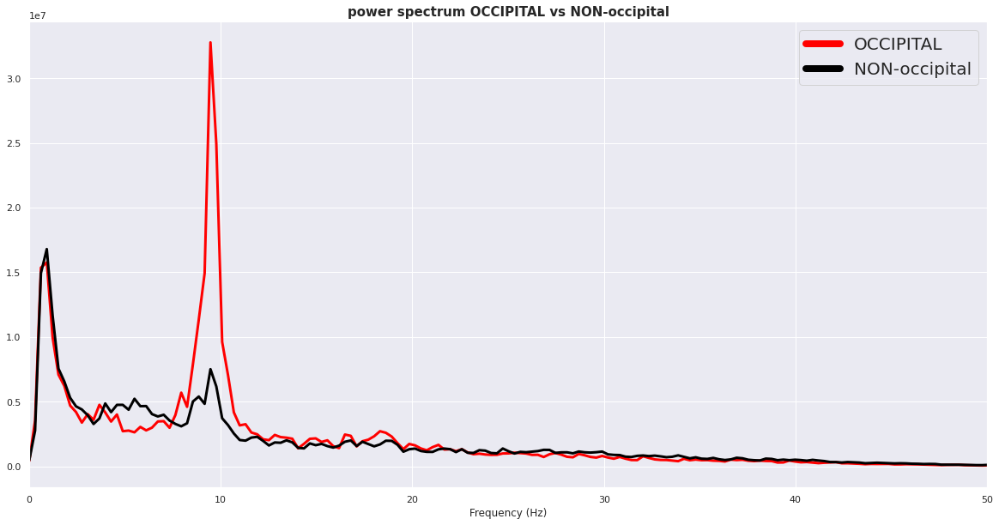

In [13]:
### --- see if we can add annotation to the lines themselves to point out occipital vs non-occipital
plt.figure(figsize=(20, 10))
plt.plot(f_occ, np.mean(pxx_occ,1), color='red', linewidth=3, label='OCCIPITAL')
plt.plot(f_nonocc, np.mean(pxx_nonocc, 1), color='black', linewidth=3, label='NON-occipital')
# add legend
leg = plt.legend(prop={'size': 20})
for line in leg.get_lines():
    line.set_linewidth(8)
#plt.plot(f, np.mean(pxx,1)+np.std(pxx,1), color='teal', linewidth=0.7)
#plt.plot(f, np.mean(pxx,1)-np.std(pxx,1), color='teal', linewidth=0.7)
#plt.fill_between(f, np.mean(pxx,1)+np.std(pxx,1), np.mean(pxx,1)
#                 -np.std(pxx,1), color='teal', alpha=0.2)
plt.xlim(0, 50)
plt.xlabel('Frequency (Hz)')
plt.title('power spectrum OCCIPITAL vs NON-occipital', size=15, weight='bold')
plt.show()

If all is well, you should see a much higher peak around 8-12Hz (the alpha band) in the occipital compared to the non-occipital (and full powerspectrum) plot(s)!

In [ ]:
### --- add same plots for all epochs of one subject and all epochs of all subjects (grand average)

<a id='fft-fc'></a>
## **4.** Fast fourier transform & functional connectivity
#### Next, we'll filter the data into frequency bands and calculate functional connectivity.

In [14]:
def fft_filt(timeseries, thres1, thres2, fs=1250, nr_rois=np.arange(210)):
    
    """ Filter timeseries between the given frequency bands (thres1 and thres2)
    
    Parameters
    ----------
    timeseries: DataFrame with ndarrays
        Rows are timepoints, columns are rois/electrodes
    fs: int, optional
        Sample frequency, default=1250
    thres1: float
        Lower bound of frequency range data should be filtered between
    thres2: float
        Upper bound of frequency range data should be filtered between
    nr_rois: int, optional
        List of rois to be included, default=np.arange(210)
        
    Returns
    -------
    f: ndarray
        Array with filtered timeseries
    
    """
    
    f = np.empty([timeseries.shape[0], nr_rois.shape[0]])
    
    freq = np.arange(1/timeseries.shape[0], fs, fs/timeseries.shape[0])
    # include only frequency band of interest
    val, inx_thr1 = min((val, inx_thr1) for (inx_thr1, val) in enumerate(np.abs(freq - thres1)))
    val, inx_thr2 = min((val, inx_thr2) for (inx_thr2, val) in enumerate(np.abs(freq - thres2)))
    
    for roi in nr_rois:
        xdft = fft(timeseries[roi])
        
        # remove all other frequencies
        xdft[0:inx_thr1+1] = 0
        xdft[inx_thr2:xdft.shape[0]-inx_thr2-1] = 0
        xdft[xdft.shape[0]-(inx_thr1+1)-1:xdft.shape[0]] = 0
        
        f[:, roi] = irfft(xdft[0:int(len(xdft)/2+1)])
        
    return f

<a id='pli'></a>
### **b.** The Phase Lag Index (PLI)
As a first measure of functional connectivity, we'll define and calculate the PLI (ref?).

In [15]:
def pli_matteo(filtered_timeseries):
    
    """ Calculate the phase lag index (ref) between all pairs of regions
    
    Parameters
    ----------
    filtered_timeseries: ndarray 
        Rows are timepoints, columns are rois/electrodes
    
    Returns
    -------
    m: ndarray
        Array with PLI between channel i and j averaged over timebins
        
    """
    
    N = nch = filtered_timeseries.shape[1]
    m = np.zeros([N, N])
    
    complex_a = signal.hilbert(filtered_timeseries, axis=0)
    
    for i in tqdm(np.arange(nch)):
        for j in np.arange(nch):
            if i < j:
                m[i, j] = abs(np.mean(np.sign(((complex_a[:, i]/complex_a[:, j]).imag))))
                
    m = m + np.transpose(m)
    return m

In [145]:
# Compute PLI in upper alpha band for first epoch piece (4096 samples)
file_epoch = file[:4096]
pli_alpha1 = pli_matteo(fft_filt(file_epoch, 8, 10))

# And set the diagonal to NaN so as not to show up in the plot
pli_alpha1_diagNaN = pli_alpha1.copy()
np.fill_diagonal(pli_alpha1_diagNaN, np.nan)

100%|██████████| 210/210 [00:02<00:00, 97.40it/s] 


In [146]:
# Compute PLI of whole first epoch - so epoch pieces and then average
nperseg = 4096 # samples per epoch to compute PLI over
nr_rois = 210 # number of atlas regions to be used

epoch_length = np.arange(0, file.shape[0], nperseg)
temp_alpha1 = np.zeros((len(epoch_length), nr_rois, nr_rois)) # initialize output array
for temp in np.arange(len(epoch_length)):
    temp_mat = file[epoch_length[temp]:epoch_length[temp]+nperseg]
    temp_alpha1[temp,:,:] = pli_matteo(fft_filt(temp_mat, 8, 10))

100%|██████████| 210/210 [00:02<00:00, 104.57it/s]


In [153]:
# Compute average of 4 epoch segments
mean_pli_alpha1 = np.mean(temp_alpha1, axis=0)

# And set the diagonal to NaN so as not to show up in the plot
mean_pli_alpha1_diagNaN = mean_pli_alpha1.copy()
np.fill_diagonal(mean_pli_alpha1_diagNaN, np.nan)

<a id='aec'></a>
### **b.** The Amplitude Envelope Correlation (AEC)
Secondly, we'll define and calculate the AEC (ref?).

In [113]:
def smooth(a, WSZ):
    
    """ Smoothing function 
    Smoothes the input array using a moving average filter
    
    Parameters
    ----------
    a: ndarray 
        Array containing the data to be smoothed
    WSZ: int 
        Smoothing window size (must be odd)
    
    Returns
    -------
    smoothed: ndarray 
        Array containing the smoothed input data 
    
    Notes
    -----
    Reference: https://stackoverflow.com/a/40443565    
    """
    
    if WSZ % 2 == 0:
        WSZ -= 1
    
    out0 = np.convolve(a,np.ones(WSZ,dtype=int),'valid')/WSZ    
    r = np.arange(1,WSZ-1,2)
    start = np.cumsum(a[:WSZ-1])[::2]/r
    stop = (np.cumsum(a[:-WSZ:-1])[::2]/r)[::-1]
    smoothed = np.concatenate((  start , out0, stop  ))
    
    return smoothed

In [114]:
def envelopecorr(data, sm_param):
    
    """ Function to calculate amplitude envelope correlations
    
    Calculate the amplitude envelope correlation with pairwise 
    leakage correction as a measure of functional connectivity
    
    Parameters
    ----------
    data: ndarray
        Array containing filtered timeseries,
        rows are timpoints, columns are rois/electrodes 
    sm_param: int
        Smoothing window size (must be odd)
    verbose: bool, optional
        If true, progress is printed to console, default=False    
    
    Returns
    ------
    ENV_corr: nxn array of amplitude envelope correlations
    
    """
 
    ENV_corr = np.zeros((data.shape[1], data.shape[1]))
    for i in tqdm(range(0,data.shape[1])):
            
            x = data[:, i]
            htx = hilbert(x)
            htx = smooth(htx, sm_param)
            envelope_x = np.sqrt((np.power(np.real(htx),2) + np.power(np.imag(htx),2)))
            
            for j in range(0, data.shape[1]):
                if i != j:
                    y = data[:,j]
                    
                    #Regression
                    model = sm.OLS(y, x).fit()
                    #coeffs = model.params
                    #conf_inter = model.conf_int
                    resids = model.resid
                    
                    #step 1: compute the hilbert transform and bring it to the origin
                    hty = hilbert(resids)
                    hty = smooth(hty, sm_param)
                   
                    #step 2: compute envelope data
                    envelope_y = np.sqrt((np.power(np.real(hty),2) + 		np.power(np.imag(hty),2)))
                    
                    #correlation between envelopes 
                    ENV_corr[i,j] = np.corrcoef(envelope_x, envelope_y)[0,1]
        
    ENV_corr2 = (ENV_corr + ENV_corr.conj().T)/2
        
    return(ENV_corr2)

In [115]:
def get_data(filepath, sub, nr_epochs, nr_rois):
    """Function to get MEG data. 
    Extract all epochs of MEG data for the current subject. 
    
    Parameters
    ----------
    filepath: str, 
                path to directory in which MEG data is stored.
    
    sub: str,
            subject for which MEG data should be extracted e.g. 'sub_01'
    
    nr_epoch: int,
              number of epochs to extract per subject
              
    nr_rois: int,
             number of rois to be included in analysis
    
    Output
    ------
    all_epochs: pd.DataFrame, 
                contains the epochs of MEG data (for every roi) for the current subjects 
              
    """

        
    #get all files of subject that are in MEG directory of subject
    path = os.path.join(filepath, sub) 
    files = [file for file in sorted(os.listdir(path))]
        
    all_epochs = []    
    for j in range(0, nr_epochs): 
            
        #load every epoch (file) in directory of current subject and store in list  
        current_epoch = pd.read_table(os.path.join(path, files[j]), header = None)
        all_epochs.append(current_epoch)
        
    #concatenate epochs in pd.DataFrame
    all_epochs = pd.concat(all_epochs)   
    
    return(all_epochs)

In [148]:
# Parameters:
sample_freq = 1250
f_low = 8 
f_high = 10 
nr_rois = 210
sm_param = math.floor(sample_freq * 0.25)
nr_epochs = 4

In [117]:
filepath = '/home/kingwizard/mumo_projects/meg_datacheck/meg_data/'
subs = ['sub_01']
for i, sub in enumerate(subs):
    print(sub)

sub_01


In [149]:
# Loop through subjects:
AEC = np.zeros((nr_rois, nr_rois, len(subs)))

for i, sub in enumerate(subs):
    
    #1.) extract and concatenate all timeseries for subject i 
    timeseries = get_data(filepath, sub, nr_epochs, nr_rois)
    
    #2.) filter the data into frequency band
    data_filt = fft_filt(timeseries, f_low, f_high, sample_freq, np.arange(0,nr_rois))
    
    #3.) calculate and store amplitude envelope correlations 
    AEC[:, : , i] = envelopecorr(data_filt, sm_param)

100%|██████████| 210/210 [17:21<00:00,  4.96s/it]


In [150]:
### --- (AECc + 1)/2 to correct for negative values? -> this is clearly not in the function as seen by the
### adjacency matrix; but Shanna mentioned this in her presentation (@knw 21.02.26) -- and i think in an
### earlier email conversation as well, !!!LOOK THIS UP!!!

# Correct for negative values
aec_alpha1_corr = AEC[:, :, 0].copy()
aec_alpha1_corr = (aec_alpha1_corr + 1)/2

# Set diagonal to NaN
np.fill_diagonal(aec_alpha1_corr, np.nan)

# And convert to dataframe
df_aec_alpha1 = pd.DataFrame(data=aec_alpha1_corr)

<a id='data-check-2'></a>
## **5.** Checking the data - II
<a id='adjacency-matrix'></a>
### a. Adjacency matrices

Text(0.5, 1.0, 'PLI adjacency matrix - alpha1')

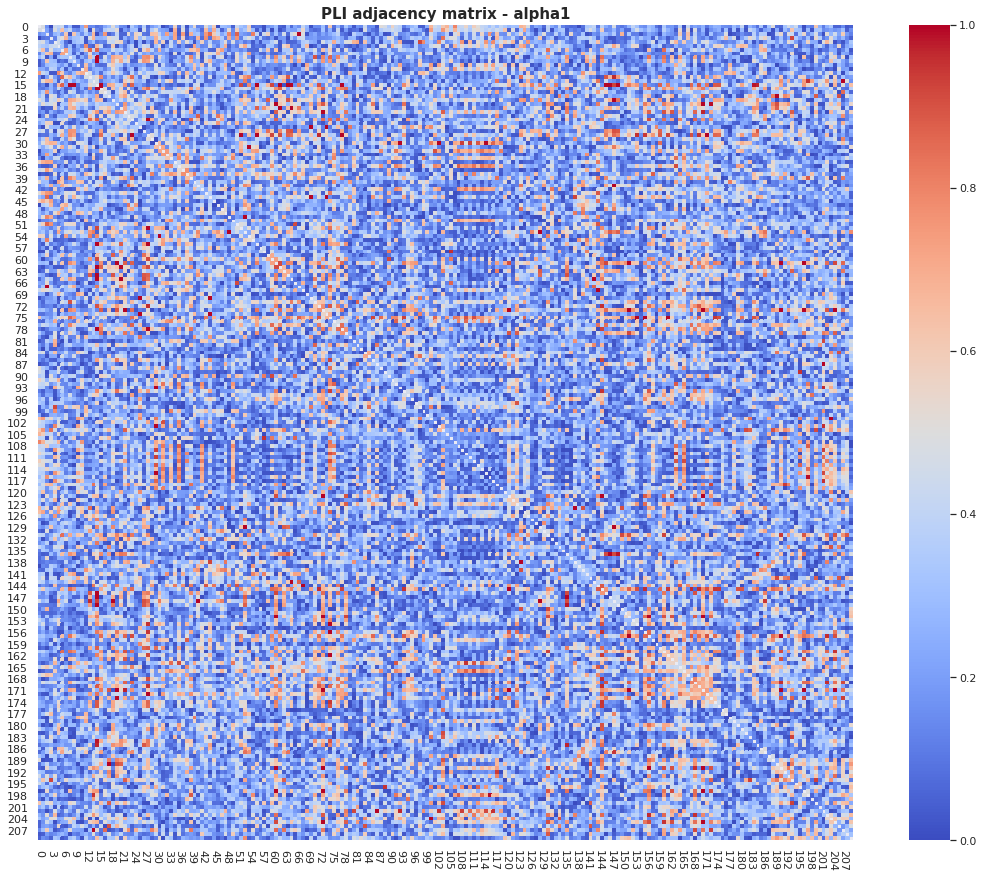

In [158]:
# Plot the correlation matrix of one epoch segment
plt.figure(figsize = (20, 15))
plt.xticks(rotation=270)
_ = sns.heatmap(pli_alpha1_diagNaN, cmap='coolwarm', cbar=True, square=True, mask=False, 
                xticklabels=3, yticklabels=3)
_.set_title('PLI adjacency matrix - alpha1', size=15, fontweight='bold')

Text(0.5, 1.0, 'PLI adjacency matrix - alpha1')

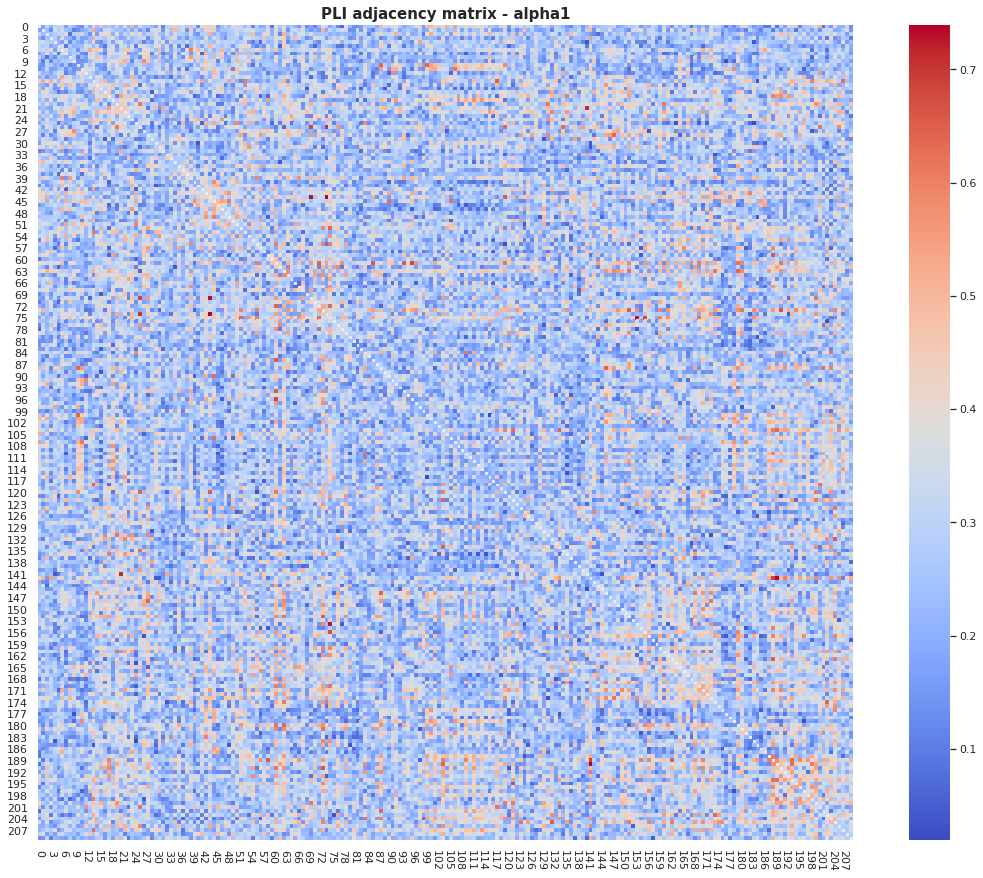

In [157]:
# Plot the average correlation matrix of one epoch (multiple segments)
plt.figure(figsize = (20, 15))
plt.xticks(rotation=270)
_ = sns.heatmap(mean_pli_alpha1_diagNaN, cmap='coolwarm', cbar=True, square=True, mask=False, 
                xticklabels=3, yticklabels=3)
_.set_title('PLI adjacency matrix - alpha1', size=15, fontweight='bold')

Text(0.5, 1.0, 'AEC adjacency matrix - alpha1')

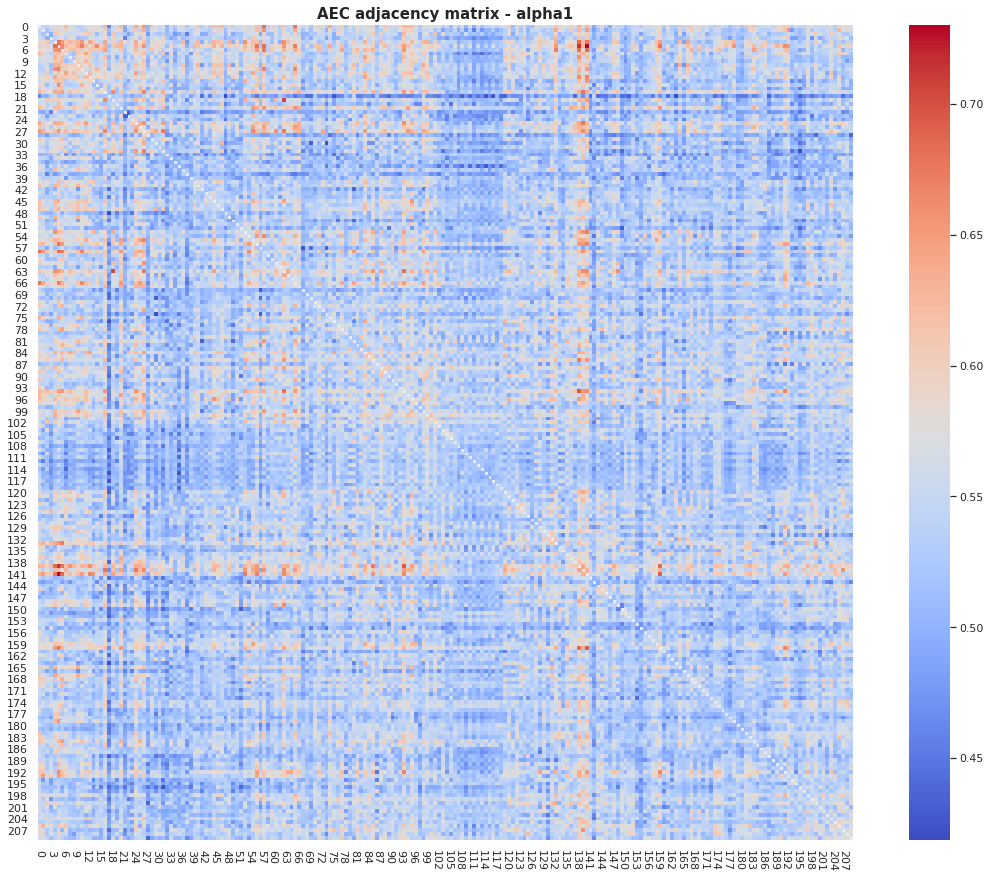

In [156]:
# Plot AEC correlation matrix of one subject
plt.figure(figsize = (20, 15))
plt.xticks(rotation=270)
_ = sns.heatmap(aec_alpha1_corr, cmap='coolwarm', cbar=True, square=True, mask=False, 
                xticklabels=3, yticklabels=3)
_.set_title('AEC adjacency matrix - alpha1', size=15, fontweight='bold')

<a id='check-signal'></a>
### b. Check for empty or weird signals

In [159]:
# Checking if there are NaNs, infs, zeros in the mean matrix
print('Matrix has Infs: ' + str(np.isinf(mean_pli_alpha1).any()))
print('Matrix has NaNs: ' + str(np.isnan(mean_pli_alpha1).any()))
print('Matrix has Zeros: ' + str((mean_pli_alpha1_diagNaN == 0).any()))

Matrix has Infs: False
Matrix has NaNs: False
Matrix has Zeros: False


Text(0.5, 1.0, 'Empty regions - mean PLI alpha1')

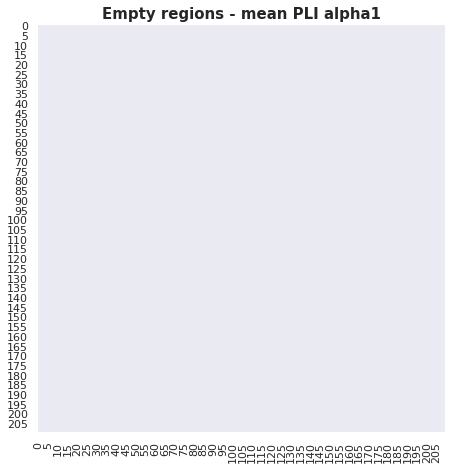

In [162]:
# Plot the correlation matrix with ONLY THE 0s!
cmap1 = mpl.colors.ListedColormap(['r'])

plt.figure(figsize = (10, 7.5))
plt.xticks(rotation=270)
_ = sns.heatmap(mean_pli_alpha1_diagNaN, mask=mean_pli_alpha1_diagNaN!=0, cmap=cmap1, cbar=False,
                square=True, xticklabels=5, yticklabels=5)
_.set_title('Empty regions - mean PLI alpha1', size=15, fontweight='bold')

In [161]:
# Checking if there are NaNs, infs, zeros IN ONE EPOCH PIECE - note that this isn't very informative
print('Matrix has Infs: ' + str(np.isinf(pli_alpha1).any()))
print('Matrix has NaNs: ' + str(np.isnan(pli_alpha1).any()))
print('Matrix has Zeros: ' + str((pli_alpha1 == 0).any()))

Matrix has Infs: False
Matrix has NaNs: False
Matrix has Zeros: True


Text(0.5, 1.0, 'Empty regions - PLI alpha1')

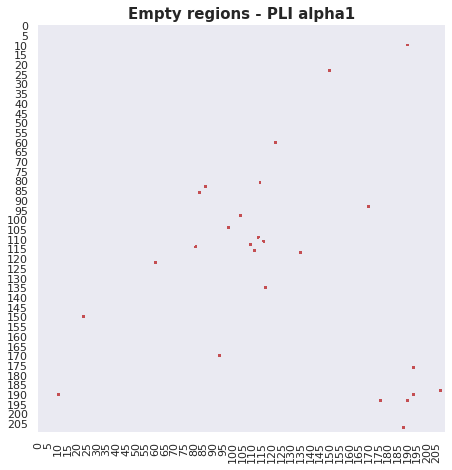

In [163]:
# Plot the correlation matrix with ONLY THE 0s!
cmap1 = mpl.colors.ListedColormap(['r'])

plt.figure(figsize = (10, 7.5))
plt.xticks(rotation=270)
_ = sns.heatmap(pli_alpha1_diagNaN, mask=pli_alpha1_diagNaN!=0, cmap=cmap1, cbar=False,
                square=True, xticklabels=5, yticklabels=5)
_.set_title('Empty regions - PLI alpha1', size=15, fontweight='bold')

<a id='occ-network'></a>
### c. The occipital network

#### The BNA is originally ordered left-right left-right; we'll re-order it to be all left-hem regions first, and all right-hem regions after that - and simultaneously we'll group regions belonging to the same Yeo subnetwork together.

In [166]:
df = pd.DataFrame(mean_pli_alpha1_diagNaN)

In [167]:
# View the initial ordering - should be from 0-N
df

,0,1,2,3,4,5,6,7,8,9,...,200,201,202,203,204,205,206,207,208,209
0,NaN,0.175903,0.303467,0.212891,0.315674,0.311279,0.306030,0.175415,0.276611,0.229126,...,0.361328,0.498901,0.078491,0.253906,0.153198,0.394653,0.207275,0.205078,0.297974,0.138672
1,0.175903,NaN,0.237061,0.133545,0.351440,0.270386,0.341187,0.237915,0.217529,0.101807,...,0.275391,0.138062,0.322876,0.306885,0.325439,0.189453,0.198853,0.271729,0.365967,0.150146
2,0.303467,0.237061,NaN,0.245361,0.284546,0.303711,0.303223,0.390747,0.085938,0.293945,...,0.226318,0.297852,0.307373,0.373779,0.321899,0.372314,0.258911,0.311157,0.164673,0.309814
3,0.212891,0.133545,0.245361,NaN,0.269897,0.183960,0.403198,0.224243,0.205078,0.129150,...,0.365234,0.151733,0.313599,0.102905,0.399780,0.140137,0.185913,0.268311,0.248047,0.111328
4,0.315674,0.351440,0.284546,0.269897,NaN,0.219482,0.171997,0.338623,0.129761,0.251221,...,0.227295,0.314209,0.239990,0.392334,0.296509,0.200439,0.137451,0.389893,0.163330,0.225220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205,0.394653,0.189453,0.372314,0.140137,0.200439,0.196777,0.247070,0.330688,0.372925,0.284546,...,0.323975,0.182251,0.258179,0.347534,0.499878,NaN,0.278442,0.313599,0.233521,0.373169
206,0.207275,0.198853,0.258911,0.185913,0.137451,0.264771,0.351807,0.321533,0.219727,0.327271,...,0.479858,0.179810,0.350952,0.277588,0.365356,0.278442,NaN,0.288940,0.287842,0.333008
207,0.205078,0.271729,0.311157,0.268311,0.389893,0.153687,0.213257,0.336914,0.335938,0.226440,...,0.335083,0.294556,0.274536,0.474121,0.350220,0.313599,0.288940,NaN,0.266113,0.343994
208,0.297974,0.365967,0.164673,0.248047,0.163330,0.318237,0.329468,0.263916,0.230347,0.243774,...,0.469116,0.150391,0.334595,0.445679,0.398682,0.233521,0.287842,0.266113,NaN,0.294189


In [28]:
# Define function to re-order regions of the BNA according to subnetwork; first left, 
# then right (similar to AAL)

def reorder(adjmat, subnet_filepath, subcortical=False):
    """" Reorder a connectivity matrix according to a specific ordering (e.g. BNA in order 
    of subnetwork, with all left hemisphere regions first and then all right hemisphere regions)
    
    Parameters
    ----------
    adjmat: dataframe
        Dataframe to be reordered
    subnet_filepath: string
        Path to tab-delimited .txt file containing desired order of regions
    subcortical: boolean, optional
        Specify whether there are subcortical regions in adjmat, default=False
        
    Returns
    -------
    adjmat_reorder: dataframe
        Reordered dataframe
        
    """
    
    subnetorder = pd.read_csv(subnet_filepath, delimiter='\t')
    
    if subcortical == False:
        subnetorder.drop(subnetorder[subnetorder['Yeo Labels'] == 'subcortical'].index, inplace=True)

    roiorder = subnetorder["BNA region"]
    roiorder = list(map(lambda x: x.replace('BNA ', ''), roiorder))
    roiorder_int = list(map(int, roiorder))
    roiorder_id = [x - 1 for x in roiorder_int]
    
    adjmat_reorder = adjmat[roiorder_id]
    adjmat_reorder = adjmat_reorder.loc[roiorder_id]
    
    return adjmat_reorder

In [168]:
subnet_filepath = './bna_subnetorder.txt'
df_reorder = reorder(df, subnet_filepath, subcortical=False)

In [169]:
df_reorder

,104,118,134,188,190,192,194,196,198,200,...,81,83,87,121,143,153,175,177,181,187
104,NaN,0.562744,0.645386,0.466675,0.639160,0.546143,0.349976,0.454346,0.521606,0.443481,...,0.320801,0.164551,0.258911,0.366333,0.191528,0.372681,0.249268,0.189209,0.405884,0.161133
118,0.562744,NaN,0.478516,0.278809,0.456665,0.512695,0.319214,0.383789,0.391602,0.456177,...,0.133423,0.229614,0.183960,0.222412,0.375610,0.386841,0.134888,0.265991,0.195679,0.308350
134,0.645386,0.478516,NaN,0.249023,0.281372,0.359009,0.545898,0.274780,0.370361,0.584595,...,0.295288,0.229614,0.378784,0.218994,0.128784,0.393677,0.281860,0.043945,0.319336,0.221191
188,0.466675,0.278809,0.249023,NaN,0.128052,0.233643,0.438965,0.199951,0.262451,0.367676,...,0.247681,0.256226,0.271240,0.253784,0.218750,0.231079,0.273926,0.124146,0.442261,0.145020
190,0.639160,0.456665,0.281372,0.128052,NaN,0.358154,0.627563,0.415527,0.358398,0.544434,...,0.200195,0.327515,0.170654,0.209717,0.209961,0.195068,0.328125,0.091553,0.459473,0.149658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,0.372681,0.386841,0.393677,0.231079,0.195068,0.189453,0.328491,0.193115,0.126465,0.415771,...,0.221924,0.236572,0.353516,0.344238,0.348999,NaN,0.272461,0.200562,0.392334,0.272095
175,0.249268,0.134888,0.281860,0.273926,0.328125,0.328857,0.164673,0.228882,0.197021,0.198853,...,0.304077,0.205200,0.354980,0.360107,0.347168,0.272461,NaN,0.145386,0.299316,0.251587
177,0.189209,0.265991,0.043945,0.124146,0.091553,0.097290,0.231201,0.093750,0.165161,0.172485,...,0.140503,0.345337,0.148071,0.061035,0.244873,0.200562,0.145386,NaN,0.342163,0.263794
181,0.405884,0.195679,0.319336,0.442261,0.459473,0.495728,0.364380,0.479370,0.445801,0.288818,...,0.270752,0.231079,0.555176,0.183350,0.295532,0.392334,0.299316,0.342163,NaN,0.268311


#### The dataframe has been re-ordered! Now let's rename the columns and rows, so that their labels indicate the correct BNA region.

In [170]:
regs = pd.read_csv(subnet_filepath, delimiter='\t')
regs = regs.drop(regs[regs['Yeo Labels'] == 'subcortical'].index)
regs = regs.reset_index(drop=True)
names = {i: regs['BNA region'][j] for i, j in zip(list(df_reorder), range(len(df_reorder)))}
df_reorder = df_reorder.rename(index = names, columns = names)

In [171]:
df_reorder

,BNA 105,BNA 119,BNA 135,BNA 189,BNA 191,BNA 193,BNA 195,BNA 197,BNA 199,BNA 201,...,BNA 82,BNA 84,BNA 88,BNA 122,BNA 144,BNA 154,BNA 176,BNA 178,BNA 182,BNA 188
BNA 105,NaN,0.562744,0.645386,0.466675,0.639160,0.546143,0.349976,0.454346,0.521606,0.443481,...,0.320801,0.164551,0.258911,0.366333,0.191528,0.372681,0.249268,0.189209,0.405884,0.161133
BNA 119,0.562744,NaN,0.478516,0.278809,0.456665,0.512695,0.319214,0.383789,0.391602,0.456177,...,0.133423,0.229614,0.183960,0.222412,0.375610,0.386841,0.134888,0.265991,0.195679,0.308350
BNA 135,0.645386,0.478516,NaN,0.249023,0.281372,0.359009,0.545898,0.274780,0.370361,0.584595,...,0.295288,0.229614,0.378784,0.218994,0.128784,0.393677,0.281860,0.043945,0.319336,0.221191
BNA 189,0.466675,0.278809,0.249023,NaN,0.128052,0.233643,0.438965,0.199951,0.262451,0.367676,...,0.247681,0.256226,0.271240,0.253784,0.218750,0.231079,0.273926,0.124146,0.442261,0.145020
BNA 191,0.639160,0.456665,0.281372,0.128052,NaN,0.358154,0.627563,0.415527,0.358398,0.544434,...,0.200195,0.327515,0.170654,0.209717,0.209961,0.195068,0.328125,0.091553,0.459473,0.149658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BNA 154,0.372681,0.386841,0.393677,0.231079,0.195068,0.189453,0.328491,0.193115,0.126465,0.415771,...,0.221924,0.236572,0.353516,0.344238,0.348999,NaN,0.272461,0.200562,0.392334,0.272095
BNA 176,0.249268,0.134888,0.281860,0.273926,0.328125,0.328857,0.164673,0.228882,0.197021,0.198853,...,0.304077,0.205200,0.354980,0.360107,0.347168,0.272461,NaN,0.145386,0.299316,0.251587
BNA 178,0.189209,0.265991,0.043945,0.124146,0.091553,0.097290,0.231201,0.093750,0.165161,0.172485,...,0.140503,0.345337,0.148071,0.061035,0.244873,0.200562,0.145386,NaN,0.342163,0.263794
BNA 182,0.405884,0.195679,0.319336,0.442261,0.459473,0.495728,0.364380,0.479370,0.445801,0.288818,...,0.270752,0.231079,0.555176,0.183350,0.295532,0.392334,0.299316,0.342163,NaN,0.268311


#### Great! That makes it much easier to interpret any plots as well. Speaking of plots-- let's have a look at the visual network in these data. We'll do so in two different ways. First up is highlighting the regions belonging to the visual network in the full matrix:

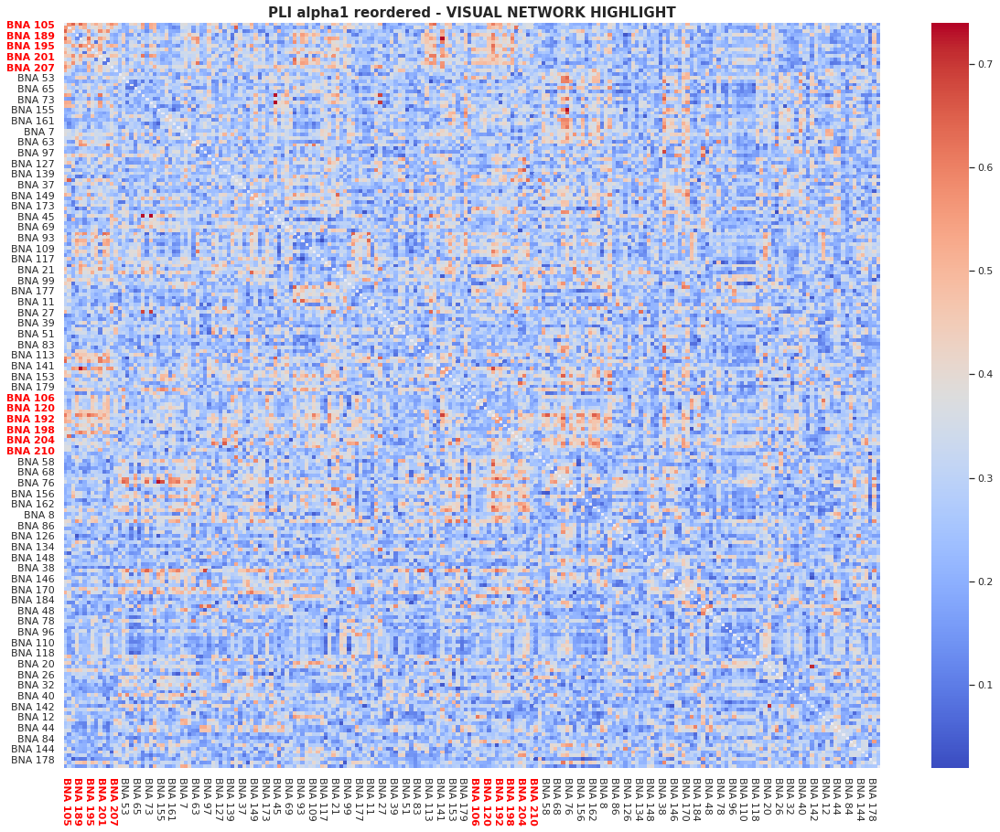

In [172]:
palette = 'coolwarm'

matdropped = df_reorder.dropna(axis=1, how='all').dropna(axis=0,how='all').copy()
plt.figure(figsize=(20,15))
plt.xticks(rotation=270)
ax = sns.heatmap(matdropped, cmap=palette, annot=False, xticklabels=3, yticklabels=3)
ax.set_title('PLI alpha1 reordered - VISUAL NETWORK HIGHLIGHT', size=15, fontweight='bold')

vis = np.where(regs==1)[0]
visNAMES = regs['BNA region'].iloc[vis]
visNAMES = list(visNAMES)
for laby,labx in zip(ax.get_yticklabels(), ax.get_xticklabels()):
    texty = laby.get_text()
    textx = labx.get_text()
    if texty in visNAMES:
        laby.set_weight('bold')
        laby.set_color('red')
    if textx in visNAMES:
        labx.set_weight('bold')
        labx.set_color('red')

#### Second-- plotting only the regions of the visual network:

Text(0.5, 1.0, 'PLI alpha1 - VISUAL NETWORK ONLY')

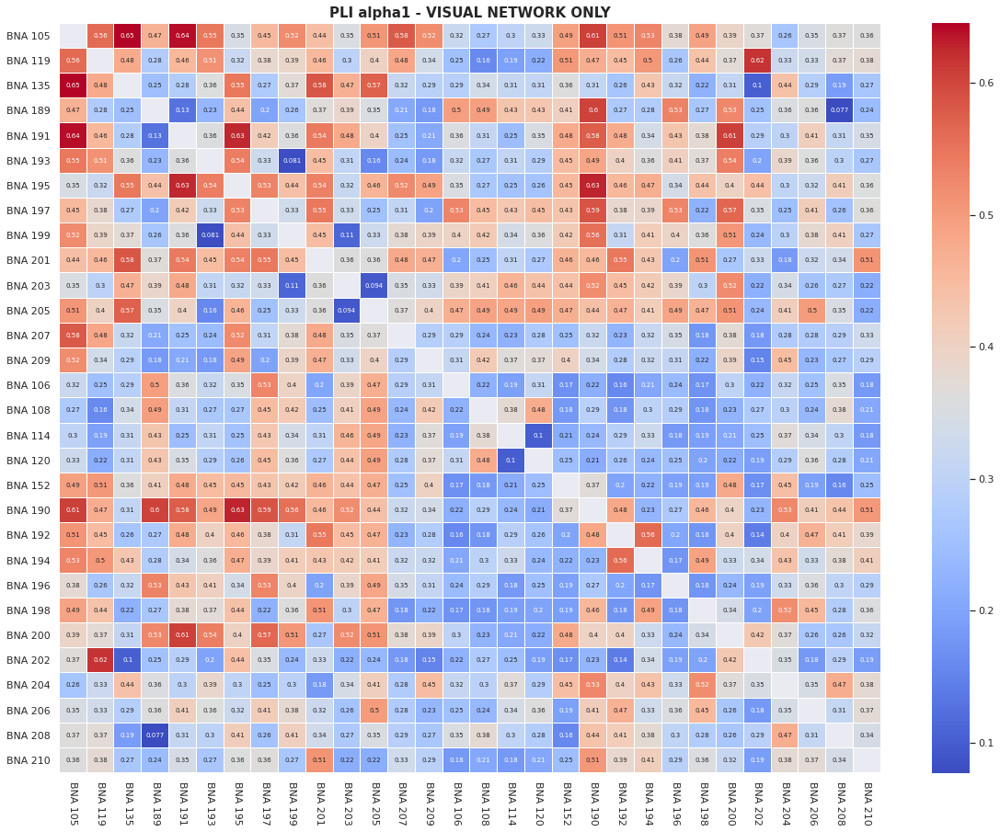

In [173]:
df_vis = df_reorder.iloc[vis,vis]
   
plt.figure(figsize=(20,15))
plt.xticks(rotation=270)
ax = sns.heatmap(df_vis, cmap=palette, annot=True, linewidths=0.01, annot_kws = {"size":7})
ax.set_title('PLI alpha1 - VISUAL NETWORK ONLY', size=15, fontweight='bold')
#labels = [value.get_text() for value in list(ax.get_xticklabels())]
#labelsy = [value.get_text() for value in list(ax.get_yticklabels())]
#ax.set_yticklabels(pd.DataFrame(names).iloc[labelsy][0], rotation=0)
#ax.set_xticklabels(pd.DataFrame(names).iloc[labels][0])
#ax.set_xlim(0, len(dfDMN))
#ax.set_ylim(len(dfDMN), 0)

In [175]:
# Let's reorder the AEC also
aec_alpha1_reorder = reorder(df_aec_alpha1, subnet_filepath, subcortical=False)

# ...and rename
names = {i: regs['BNA region'][j] for i, j in zip(list(aec_alpha1_reorder), 
                                                  range(len(aec_alpha1_reorder)))}
aec_alpha1_reorder = aec_alpha1_reorder.rename(index = names, columns = names)
aec_alpha1_reorder

,BNA 105,BNA 119,BNA 135,BNA 189,BNA 191,BNA 193,BNA 195,BNA 197,BNA 199,BNA 201,...,BNA 82,BNA 84,BNA 88,BNA 122,BNA 144,BNA 154,BNA 176,BNA 178,BNA 182,BNA 188
BNA 105,NaN,0.516841,0.514953,0.552939,0.550540,0.570875,0.520398,0.528727,0.550510,0.508244,...,0.524271,0.552924,0.487971,0.574625,0.505436,0.529492,0.558592,0.528373,0.538062,0.532467
BNA 119,0.516841,NaN,0.503437,0.513755,0.505068,0.548787,0.513123,0.498790,0.528069,0.531315,...,0.502523,0.534824,0.479734,0.531996,0.525417,0.548165,0.575299,0.500761,0.542503,0.500287
BNA 135,0.514953,0.503437,NaN,0.536620,0.560721,0.536062,0.524732,0.581319,0.558854,0.497216,...,0.507868,0.544298,0.488412,0.498738,0.523450,0.563572,0.567754,0.566995,0.559095,0.570888
BNA 189,0.552939,0.513755,0.536620,NaN,0.525003,0.558174,0.535533,0.547187,0.551047,0.537896,...,0.485160,0.530342,0.469800,0.529321,0.512742,0.492629,0.488224,0.539657,0.485114,0.552103
BNA 191,0.550540,0.505068,0.560721,0.525003,NaN,0.573517,0.536518,0.541142,0.602998,0.581187,...,0.523655,0.508506,0.467136,0.559783,0.523029,0.530862,0.546148,0.541852,0.509139,0.562772
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BNA 154,0.529492,0.548165,0.563572,0.492629,0.530862,0.561197,0.538926,0.532987,0.583432,0.589123,...,0.563876,0.592319,0.525306,0.536061,0.501950,NaN,0.508356,0.506474,0.516720,0.512410
BNA 176,0.558592,0.575299,0.567754,0.488224,0.546148,0.623324,0.568648,0.503356,0.573825,0.580064,...,0.570076,0.561486,0.530525,0.536116,0.481298,0.508356,NaN,0.500839,0.570305,0.482241
BNA 178,0.528373,0.500761,0.566995,0.539657,0.541852,0.536185,0.511025,0.532468,0.529544,0.562608,...,0.528615,0.506316,0.524097,0.536617,0.510085,0.506474,0.500839,NaN,0.489554,0.483145
BNA 182,0.538062,0.542503,0.559095,0.485114,0.509139,0.513329,0.542277,0.498930,0.508632,0.531255,...,0.561037,0.548534,0.564494,0.534710,0.494963,0.516720,0.570305,0.489554,NaN,0.474635


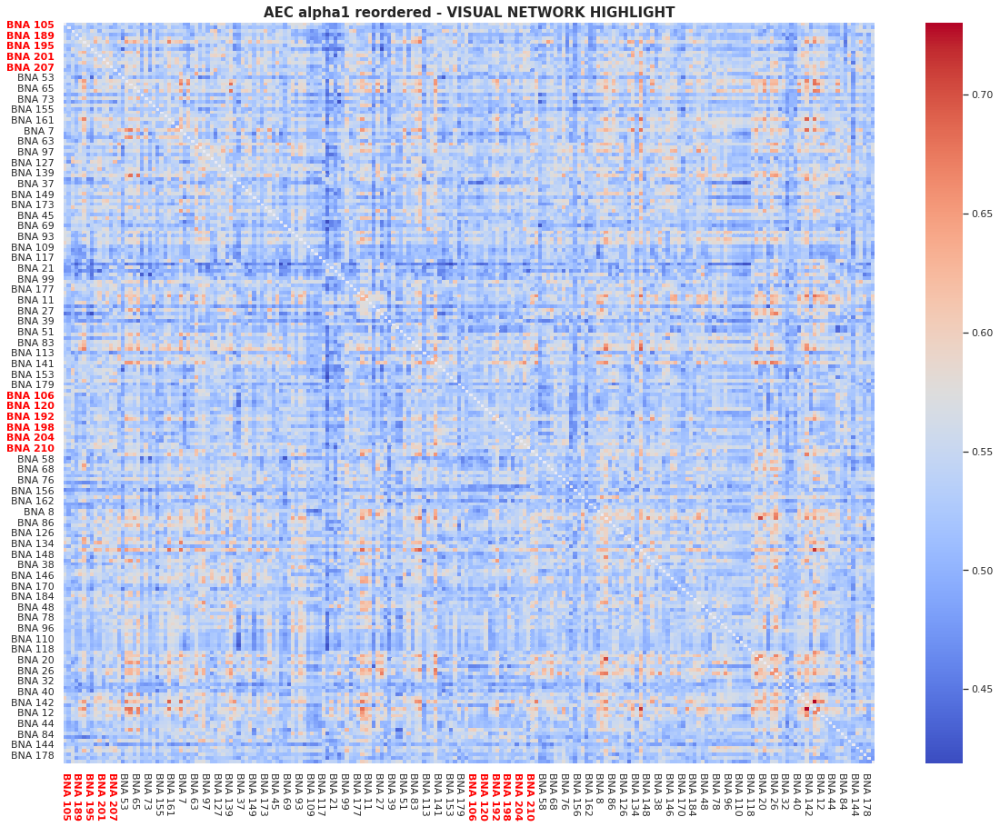

In [176]:
# AEC visual network
palette = 'coolwarm'

matdropped = aec_alpha1_reorder.dropna(axis=1, how='all').dropna(axis=0,how='all').copy()
plt.figure(figsize=(20,15))
plt.xticks(rotation=270)
ax = sns.heatmap(matdropped, cmap=palette, annot=False, xticklabels=3, yticklabels=3)
ax.set_title('AEC alpha1 reordered - VISUAL NETWORK HIGHLIGHT', size=15, fontweight='bold')

vis = np.where(regs==1)[0]
visNAMES = regs['BNA region'].iloc[vis]
visNAMES = list(visNAMES)
for laby,labx in zip(ax.get_yticklabels(), ax.get_xticklabels()):
    texty = laby.get_text()
    textx = labx.get_text()
    if texty in visNAMES:
        laby.set_weight('bold')
        laby.set_color('red')
    if textx in visNAMES:
        labx.set_weight('bold')
        labx.set_color('red')

Text(0.5, 1.0, 'AEC alpha1 - VISUAL NETWORK ONLY')

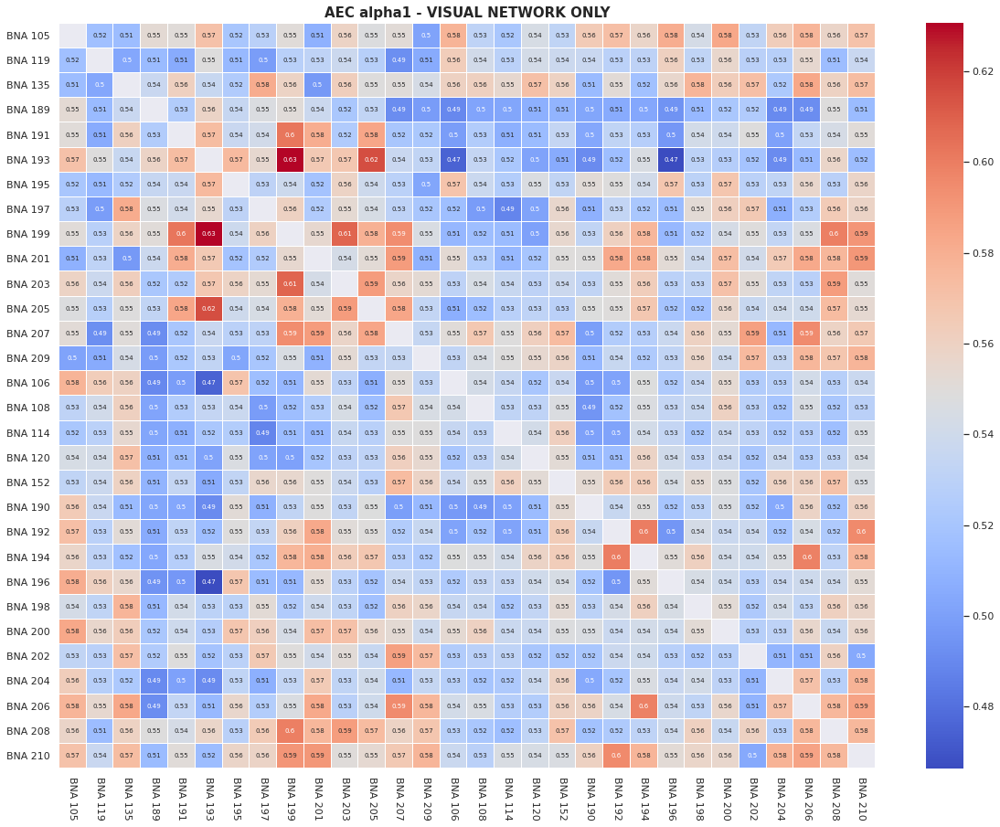

In [177]:
# And AEC visual network only
df_vis = aec_alpha1_reorder.iloc[vis,vis]
   
plt.figure(figsize=(20,15))
plt.xticks(rotation=270)
ax = sns.heatmap(df_vis, cmap=palette, annot=True, linewidths=0.01, annot_kws = {"size":7})
ax.set_title('AEC alpha1 - VISUAL NETWORK ONLY', size=15, fontweight='bold')